In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("../../../src/")

import os
import pandas as pd
import numpy as np
import random
from eda.utils_plot import get_upack_patch, save2pdf, visualize_col_data
from eda.general_eda import general_stats, general_eda_main

# Stats computation & analysis of AI4boundaries dataset

In [2]:
SENTINEL2_DIR = "ai4boundaries_dataset" # your path here

## France (FR)

In [3]:
country = "FR"

#### General EDA for the country

General information: 
           n_fields   prc_fields  sm_area_cnt  bg_area_cnt  sm_solidity_cnt  \
count  2078.000000  2078.000000  2078.000000  2078.000000      2078.000000   
mean    115.001925    37.572185    25.382579     0.647257         1.593359   
std     134.163142    27.366464    41.761784     1.237443         4.756638   
min       0.000000     0.000000     0.000000     0.000000         0.000000   
25%      11.000000    12.825000     1.000000     0.000000         0.000000   
50%      67.000000    34.600000    11.000000     0.000000         0.000000   
75%     172.000000    61.500000    33.000000     1.000000         1.750000   
max     963.000000    99.700000   654.000000    10.000000        79.000000   

       bg_solidity_cnt  sm_eccentricity_cnt      area_min     area_mean  \
count      2078.000000          2078.000000   1977.000000   1977.000000   
mean         61.879692             1.429740    250.474456    982.153551   
std          72.760653             2.875296   234

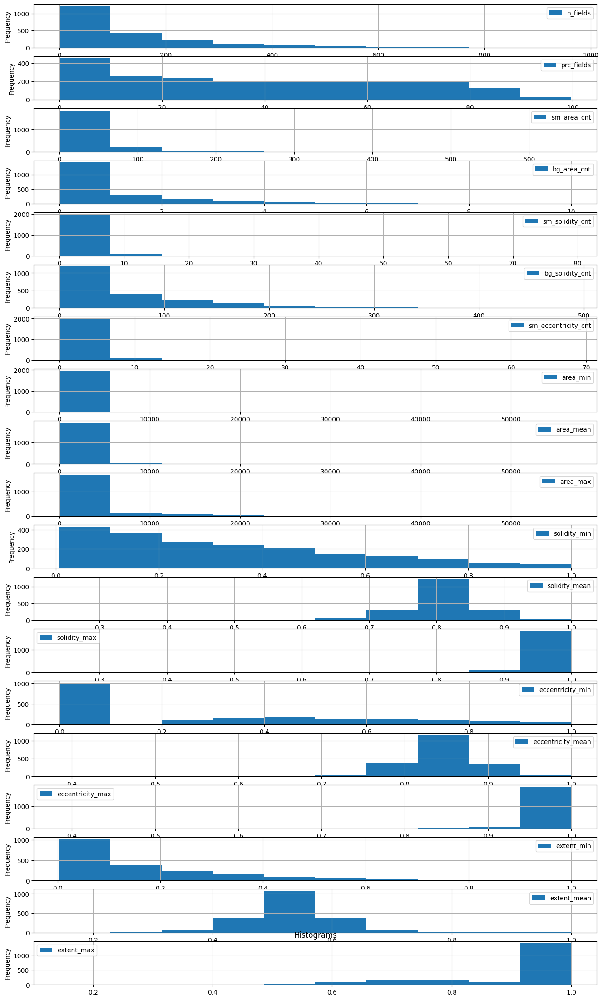

Total number of fields 0.24 M
Total area of fields in ha 51.17 M
Number of patches without fields present 101 (4.86%)
Number of patches with small percentage  (< 10) of fields present 351 (16.89%)
Number of patches with small number (< 40) of fields present 744 (35.8%)
Number of patches with small number or small percentage of fields present combined 764 (36.77%)
Number of patches with small number & small percentage of fields present combined 331 (15.93%)
Number of patches with n_fields (>= 383.33) of fields present 116 (5.58%)
Number of patches with prc_fields (>= 75.0) of fields present 236 (11.36%)
Number of patches with prc_fields (< 25.0) of fields present 826 (39.75%)
Number of patches with sm_area_cnt (>= 108.91) of fields present 86 (4.14%)
Number of patches with bg_area_cnt (>= 3.12) of fields present 91 (4.38%)
Number of patches with sm_solidity_cnt (>= 11.11) of fields present 40 (1.92%)
Number of patches with bg_solidity_cnt (>= 207.4) of fields present 112 (5.39%)
Number 

In [4]:
data = general_eda_main(SENTINEL2_DIR, country,
                     sm_prc_fields=10, sm_num_fields=40)

### Visualizations of the country data

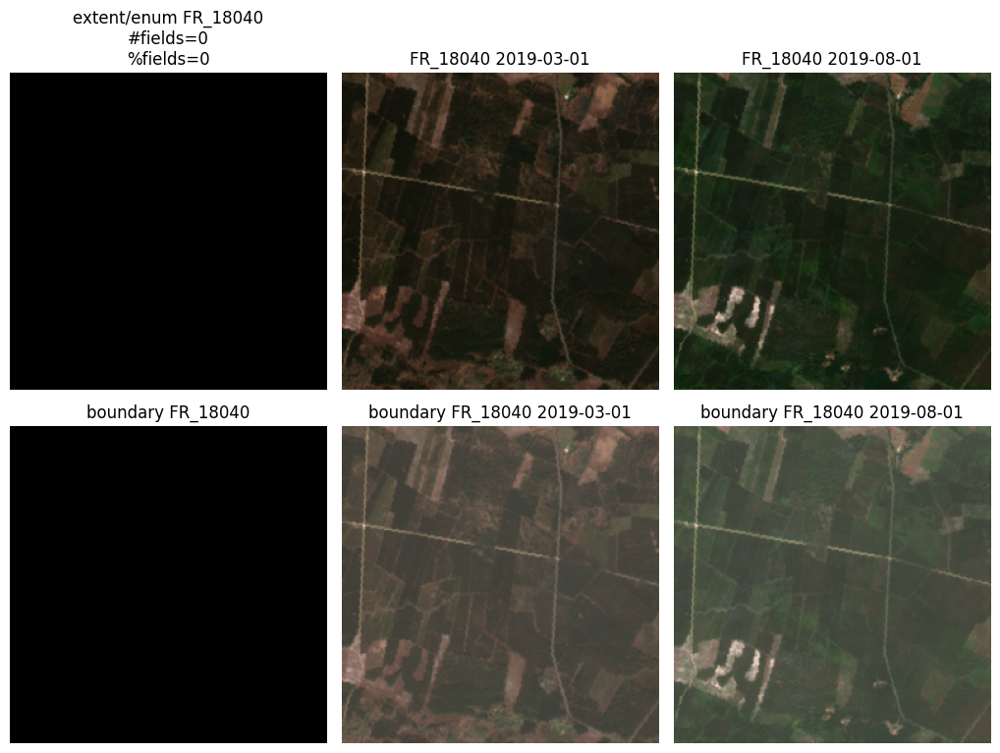

In [11]:
# visualize the data with no fields
visualize_col_data(data, SENTINEL2_DIR, country=country, col='no_field', num_img=2,
                       num_plots=1)

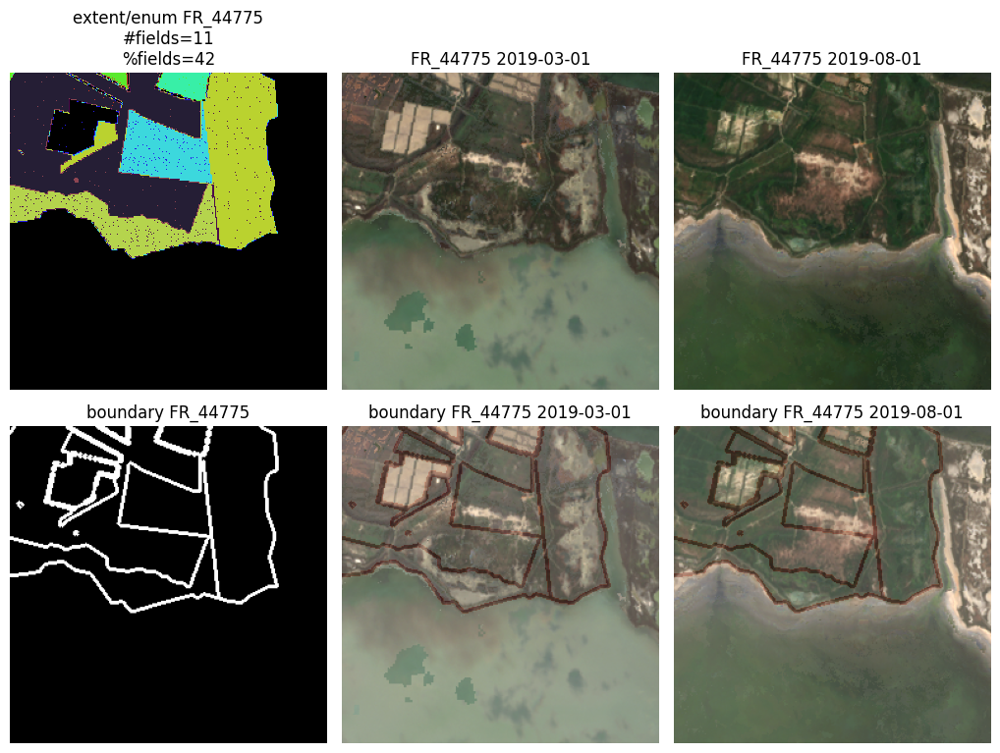

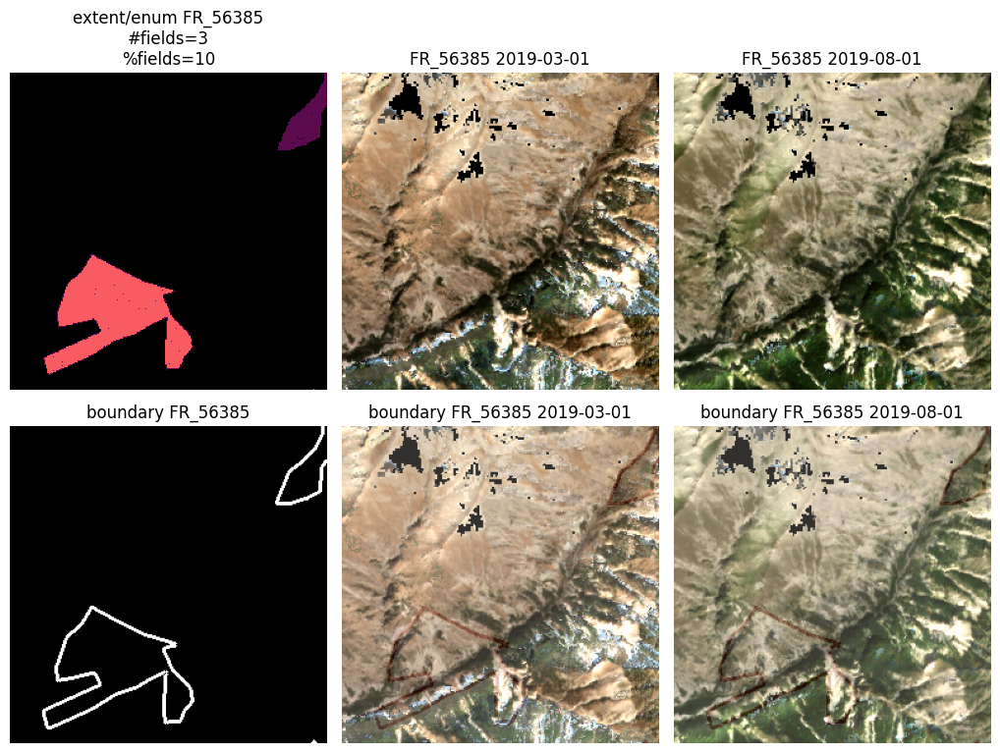

In [12]:
# visualize the data with small number of fields (<40)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_num_fields', num_img=2,
                       num_plots=2)

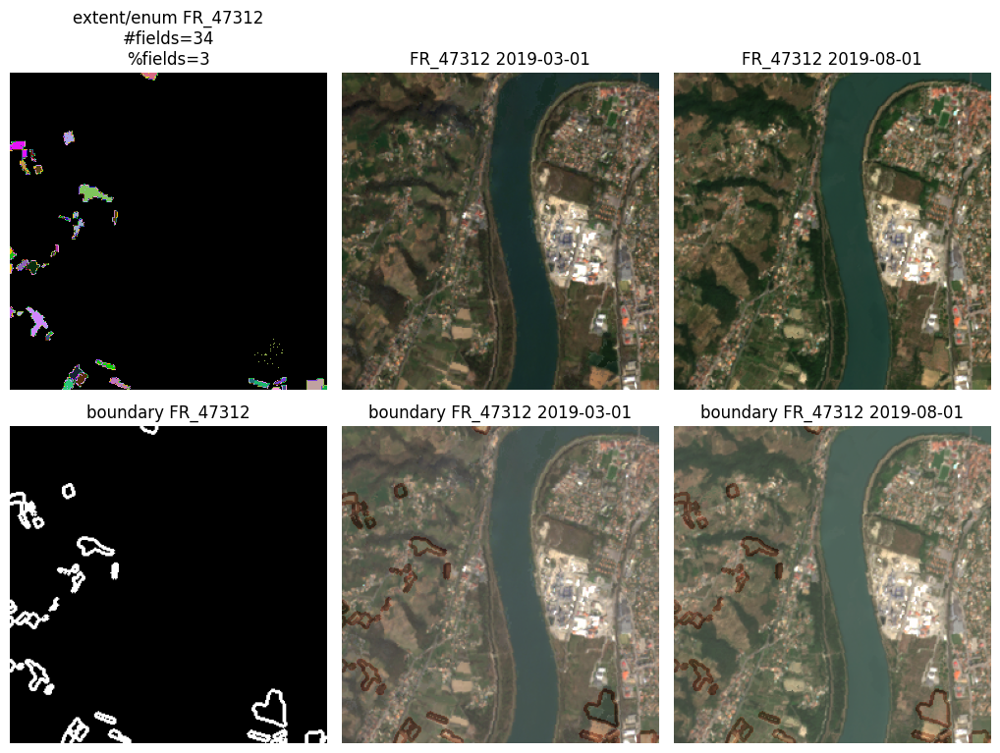

In [15]:
# visualize the data with small % of fields (<10%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_prc_fields', num_img=2,
                       num_plots=1)

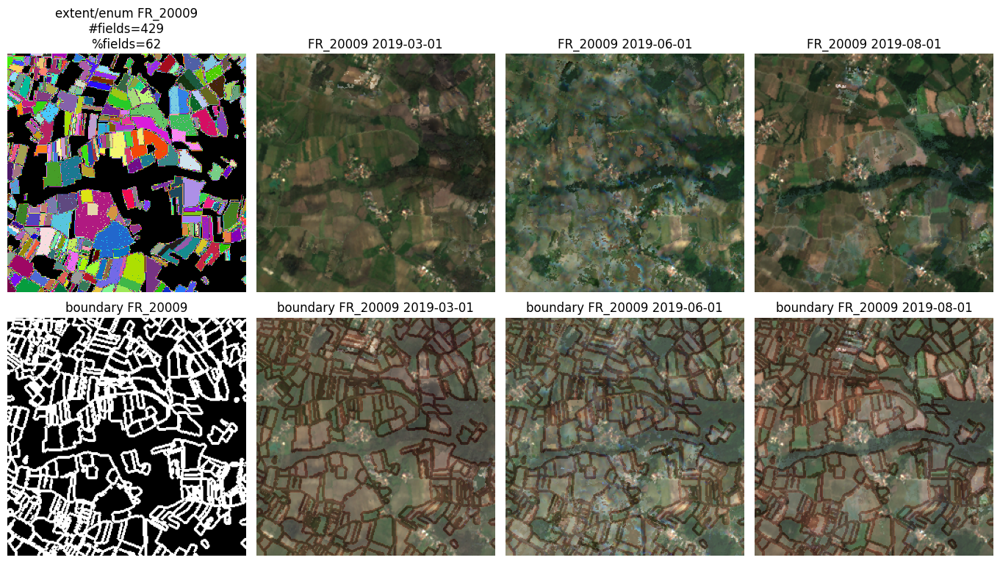

In [20]:
# visualze patches with a lot of fields present
# Number of patches with n_fields (>= 383.33) of fields present 116 (5.58%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='n_fields_gt', num_img=3,
                       num_plots=1)

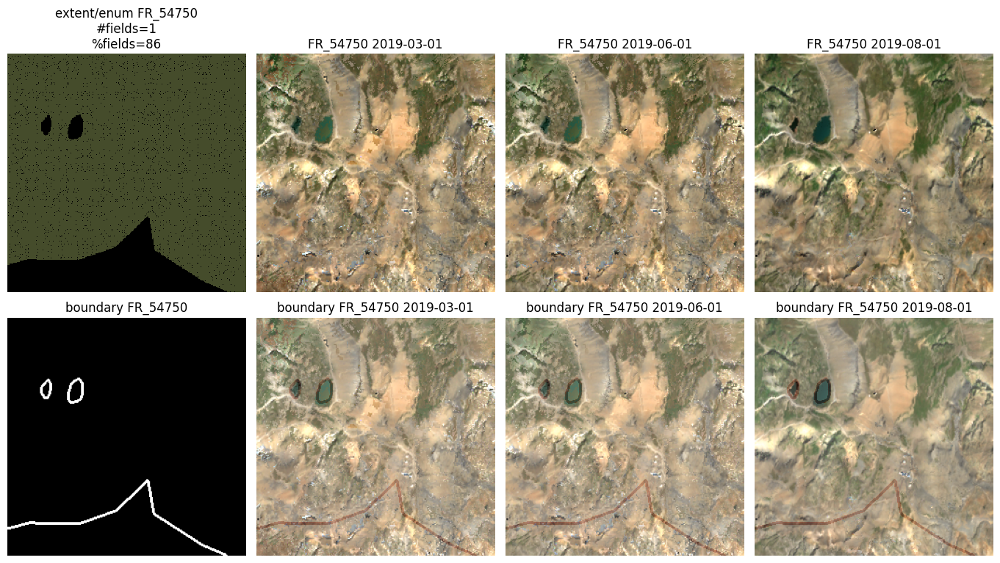

In [24]:
# visualze patches with a lot of % fields present
# Number of patches with prc_fields (>= 75.0) of fields present 236 (11.36%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='prc_fields_gt', num_img=3,
                       num_plots=1) # others -> same vis as for 'n_fields_gt'

In [ ]:
# visualze the patches with #field small area > 108
# Number of patches with sm_area_cnt (>= 108.91) of fields present 86 (4.14%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_area_cnt_gt', num_img=2,
                       num_plots=1) # no intresent -> same vis as for 'n_fields_gt'

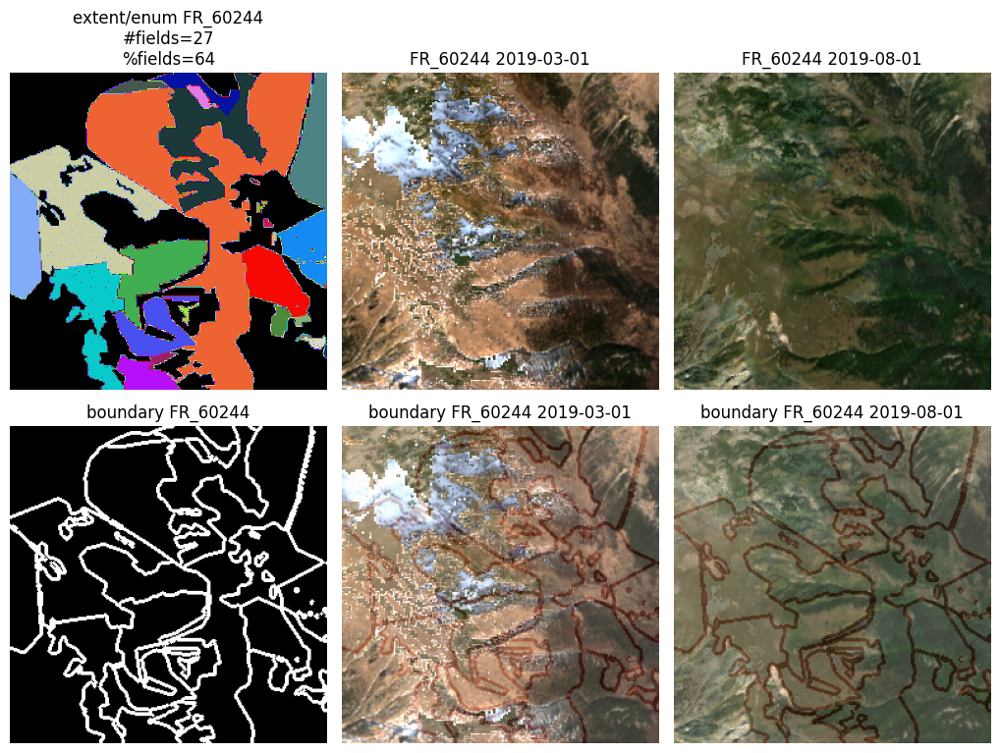

In [30]:
# visualze the patches with the following rool
# Number of patches with bg_area_cnt (>= 3.12) of fields present 91 (4.38%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_area_cnt_gt', num_img=2,
                       num_plots=1) # montain areas with big fields (others no interest)

In [ ]:
# visualze the patches with the following rool
# Number of patches with sm_solidity_cnt (>= 11.11) of fields present 40 (1.92%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_solidity_cnt_gt', num_img=1,
                       num_plots=1) # not much info

In [ ]:
# visualze the patches with the following rool
# Number of patches with bg_solidity_cnt (>= 207.4) of fields present 112 (5.39%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_solidity_cnt_gt', num_img=2,
                       num_plots=1) # no much intersent (rectangular/almost square compact fields)

In [ ]:
# visualze the patches with the following rool
# Number of patches with sm_eccentricity_cnt (>= 7.18) of fields present 69 (3.32%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_eccentricity_cnt_gt', num_img=2,
                       num_plots=1) # no intreset (small parcels, isolated fields, ...)

### Conclusion for the country (FR)



March, April (not much of the greenary visible yet in some cases). Problem of differentiating crop fields if there's nothing is planted!!!!!!:


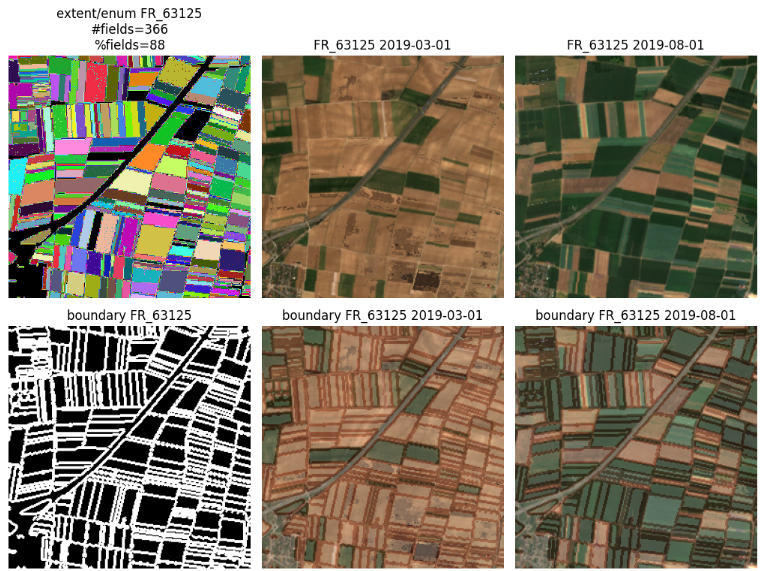


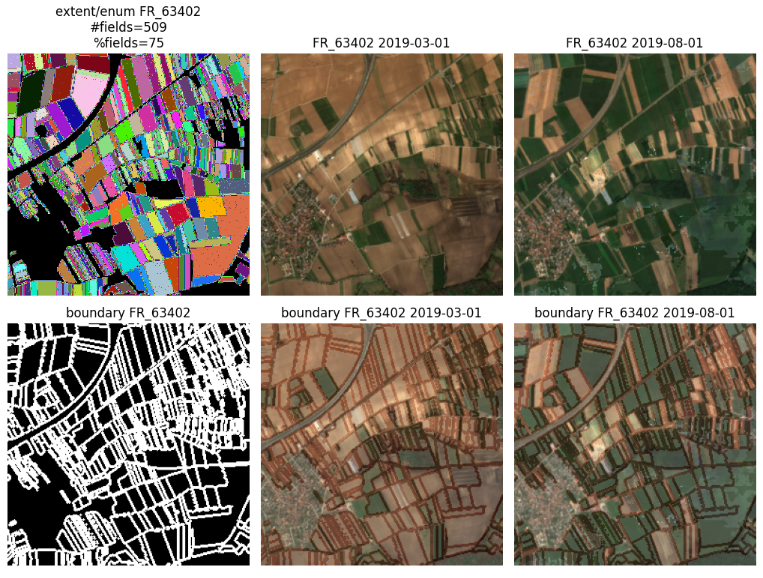

March - greenary are there (something is planted -> winter crops?):

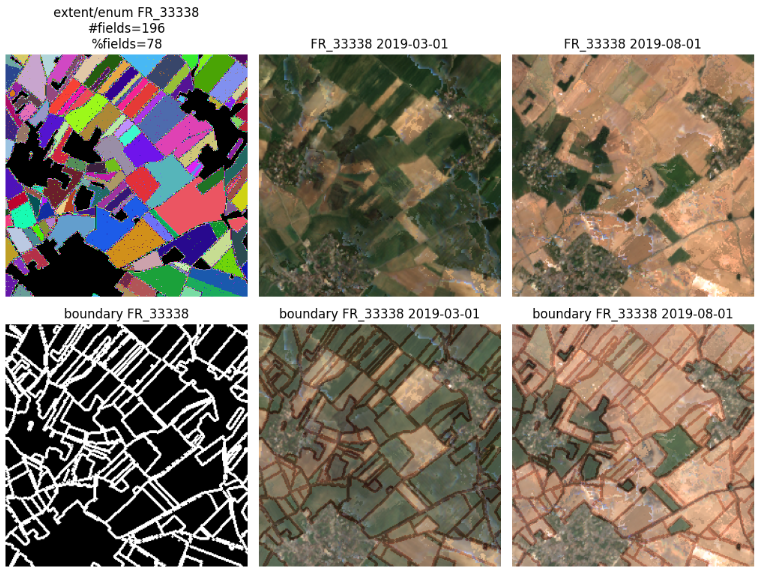

Isolated fields:

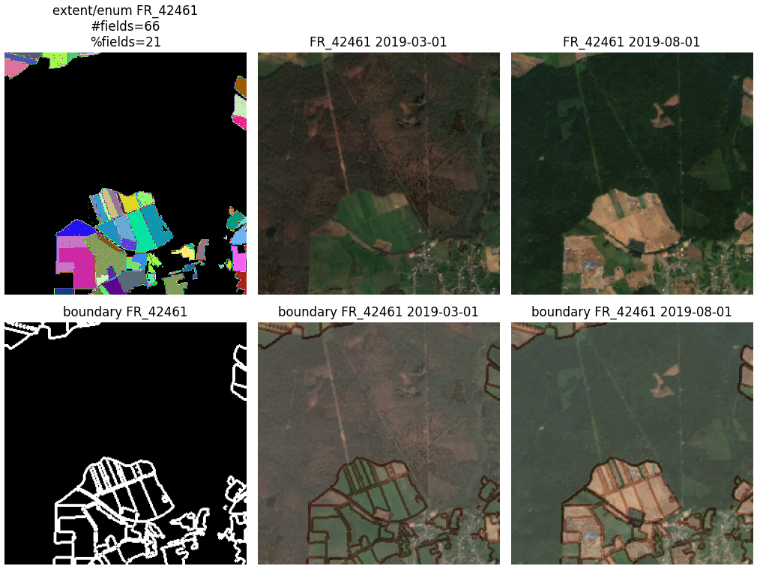

Unconventional big shapes for fields are present (montains as in AT country):

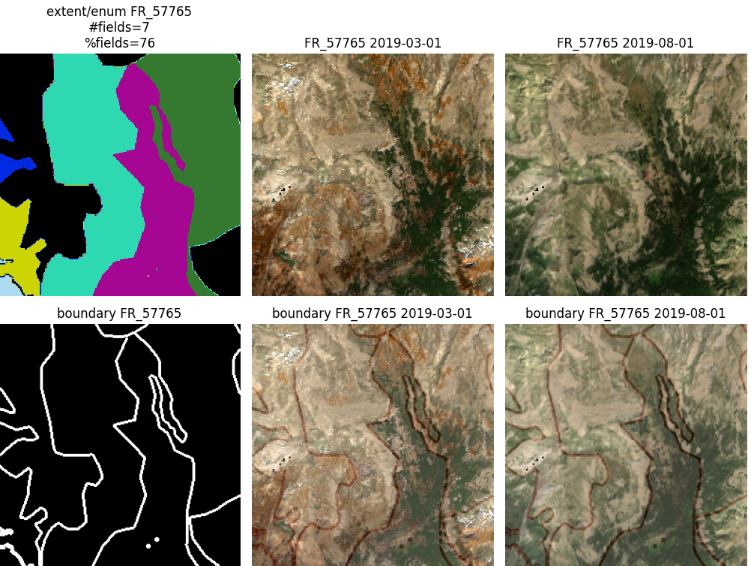

Very little greenary:


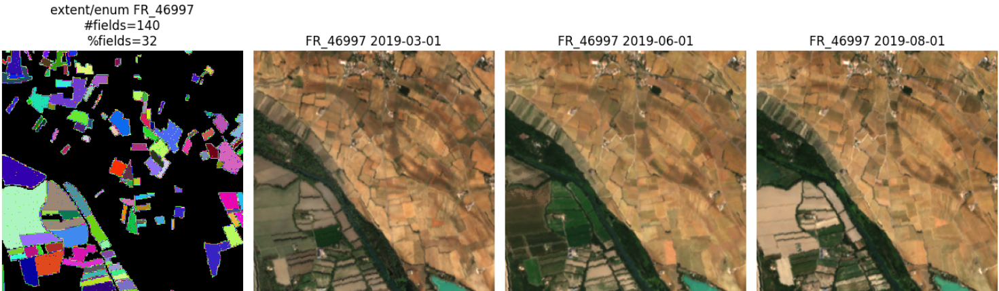

Small parcels with not similar shapes for fields (not regular rect / square):

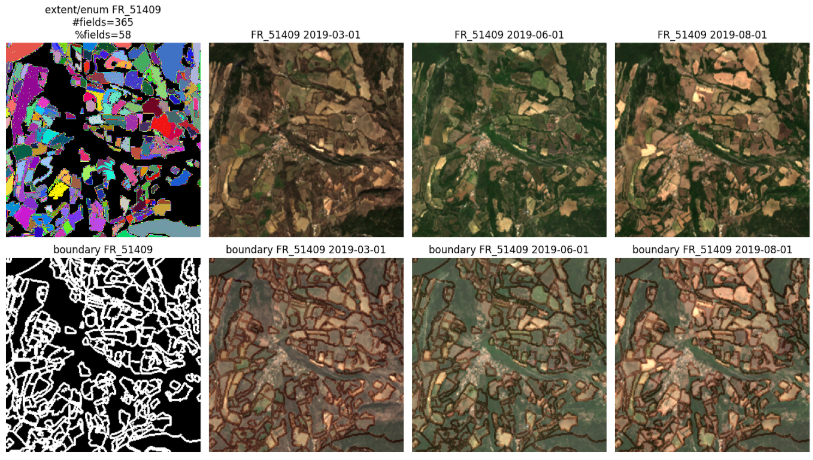

Based on eccentricity visualizations -> no circular fields. 

__TO BE DELETED__: (Number of patches without fields present 101 (4.86%)) +
(Number of patches with small number or small percentage of fields present combined 764 (36.77%)) -> ~42% delete for the training data (clouds artifacts, forest or other greenary/ montains, not clear if there shoud be a field a not).
